<a href="https://colab.research.google.com/github/yuliacandradewi/Project-AnReg/blob/main/FIX_Yulia_Candra_Dewi_2000015039_Project_UAS_AnReg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Memprediksi Harga Rumah dengan Model Regresi Random Forest

## Introduction
1. Tujuan : 
Memprediksi harga rumah di Boston

2. Deskripsi data :
Dalam kumpulan data ini, terdapat 506 pengamatan dengan 14 variabel penjelas yang menggambarkan (hampir) setiap aspek rumah hunian di Boston. Variabel tersebut meliputi:
* **CRIM** = tingkat kejahatan per kapita menurut kota
* **ZN** = proporsi lahan perumahan yang dikategorikan untuk kavling lebih dari 25.000 kaki persegi.
* **INDUS** = proporsi hektar bisnis non-ritel per kota
* **CHAS** = variabel dummy Sungai Charles (= 1 jika saluran membatasi sungai; 0 jika tidak)
* **NOX** = konsentrasi oksida nitrat (bagian per 10 juta)
* **RM** = rata-rata jumlah kamar per hunian
* **AGE** = proporsi unit yang ditempati pemilik yang dibangun sebelum tahun 1940
* **DIS** = jarak tertimbang ke lima pusat pekerjaan Boston
* **RAD** = indeks aksesibilitas ke jalan raya radial
* **TAX** = tarif pajak properti nilai penuh per 10.000usd
* **PTRATIO** = rasio murid-guru menurut kota
* **B** = 1000(Bk - 0.63)^2 dimana Bk adalah proporsi orang kulit hitam menurut kota
* **LSTAT** = % status populasi yang lebih rendah
* **PRICE** = harga rumah

Setiap catatan dalam database menggambarkan pinggiran atau kota Boston.

## Data Assessment

### Import Data

In [ ]:
# Mengimpor library yang dibutuhkan
import pandas as pd
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
# Mengimpor data Perumahan Boston
from sklearn.datasets import load_boston
boston = load_boston()

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing dataset (i.e.

In [ ]:
# Melihat dataframe
data = pd.DataFrame(boston.data)
data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [ ]:
# Menambahkan nama pada setiap variabel ke dataframe
data.columns = boston.feature_names
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


### Check Missing Data

In [ ]:
# Periksa nilai yang hilang
data.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
dtype: int64

In [ ]:
# Lihat baris pada nilai yang hilang
data[data.isnull().any(axis=1)]

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT


### Select Variables

In [ ]:
# Menambahkan variabel target ke dataframe
data['PRICE'] = boston.target 
# Nilai rata-rata rumah yang ditempati pemilik dalam $1000

In [ ]:
# Memeriksa bentuk dataframe
data.shape

(506, 14)

In [ ]:
data.columns

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'PRICE'],
      dtype='object')

In [ ]:
data.dtypes

CRIM       float64
ZN         float64
INDUS      float64
CHAS       float64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD        float64
TAX        float64
PTRATIO    float64
B          float64
LSTAT      float64
PRICE      float64
dtype: object

In [ ]:
# Mengidentifikasi jumlah nilai unik dalam kumpulan data
data.nunique()

CRIM       504
ZN          26
INDUS       76
CHAS         2
NOX         81
RM         446
AGE        356
DIS        412
RAD          9
TAX         66
PTRATIO     46
B          357
LSTAT      455
PRICE      229
dtype: int64

In [ ]:
# Melihat statistik data
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [ ]:
# Mencari tahu korelasi antara variabel
corr = data.corr()
corr.shape

(14, 14)

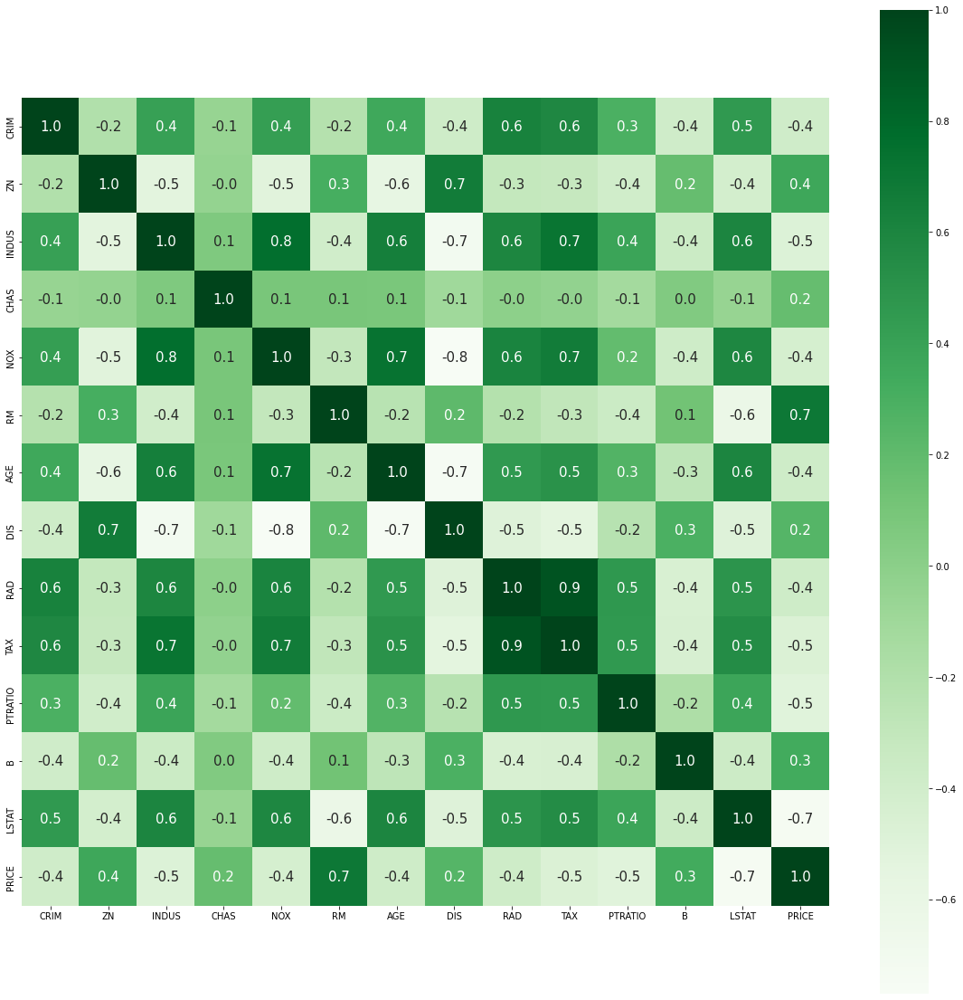

In [ ]:
# Menggambarkan peta panas korelasi antar variabel
plt.figure(figsize=(20,20))
sns.heatmap(corr, cbar=True, square= True, fmt='.1f', annot=True, annot_kws={'size':15}, cmap='Greens')

In [ ]:
# Memisahkan variabel target dan variabel bebas
X = data.drop(['PRICE'], axis = 1)
y = data['PRICE']

## Model Regresi Random Forest

In [ ]:
# Pemisahan menjadi data training dan testing
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 0)

In [ ]:
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 1000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10,110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
param_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(param_grid)

{'n_estimators': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [ ]:
# Import Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest Regressor
reg = RandomForestRegressor()

# Train the model using the training sets 
reg.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
rf_Model = RandomForestRegressor()
from sklearn.model_selection import RandomizedSearchCV
rf_RandomGrid = RandomizedSearchCV(estimator = rf_Model, param_distributions = param_grid, cv = 3, verbose = 0, n_jobs = 1)

In [ ]:
rf_RandomGrid.fit(X_train, y_train)

RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 120, 230, 340, 450,
                                                         560, 670, 780, 890,
                                                         1000]})

In [ ]:
rf_RandomGrid.best_params_

{'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 30,
 'bootstrap': False}

In [ ]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 340, random_state=0, min_samples_split=2, min_samples_leaf=1, max_features='auto', max_depth=100, bootstrap=True, criterion='mse', max_leaf_nodes=None, min_impurity_decrease=0.0, n_jobs=1, verbose=0, warm_start=False)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


In [ ]:
regressor

RandomForestRegressor(criterion='mse', max_depth=100, n_estimators=340,
                      n_jobs=1, random_state=0)

In [ ]:
regressor.fit(X_train, y_train)
              
# score model
regressor.score(X_train, y_train)

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


0.9836910786885424

In [ ]:
regressor.fit(X_test, y_test)
              
# score model
regressor.score(X_test, y_test)

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


0.967555591352995

In [ ]:
y_test

329    22.6
371    50.0
219    23.0
403     8.3
78     21.2
       ... 
56     24.7
455    14.1
60     18.7
213    28.1
108    19.8
Name: PRICE, Length: 102, dtype: float64

In [ ]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
print('MAPE:', np.mean(np.abs((y_test - y_pred)/y_pred))*100)

Mean Absolute Error: 2.6452133794694253
Mean Squared Error: 18.134530588913716
Root Mean Squared Error: 4.258465755282495
MAPE: 12.112434248758994


In [ ]:
to_pred = [0.00632, 0.0, 2.18, 0.0, 0.538, 6.421, 61.1, 6.0622, 1.0, 222.0, 17.8, 392.83, 9.14]

In [ ]:
A = y_test.values.reshape(-1,1)

In [ ]:
B = y_pred.reshape(-1,1)

In [ ]:
A

array([[22.6],
       [50. ],
       [23. ],
       [ 8.3],
       [21.2],
       [19.9],
       [20.6],
       [18.7],
       [16.1],
       [18.6],
       [ 8.8],
       [17.2],
       [14.9],
       [10.5],
       [50. ],
       [29. ],
       [23. ],
       [33.3],
       [29.4],
       [21. ],
       [23.8],
       [19.1],
       [20.4],
       [29.1],
       [19.3],
       [23.1],
       [19.6],
       [19.4],
       [38.7],
       [18.7],
       [14.6],
       [20. ],
       [20.5],
       [20.1],
       [23.6],
       [16.8],
       [ 5.6],
       [50. ],
       [14.5],
       [13.3],
       [23.9],
       [20. ],
       [19.8],
       [13.8],
       [16.5],
       [21.6],
       [20.3],
       [17. ],
       [11.8],
       [27.5],
       [15.6],
       [23.1],
       [24.3],
       [42.8],
       [15.6],
       [21.7],
       [17.1],
       [17.2],
       [15. ],
       [21.7],
       [18.6],
       [21. ],
       [33.1],
       [31.5],
       [20.1],
       [29.8],
       [15

In [ ]:
B

array([[24.09294118],
       [29.33647059],
       [22.05147059],
       [11.01558824],
       [20.82058824],
       [20.60617647],
       [21.23676471],
       [20.15147059],
       [20.09970588],
       [18.99882353],
       [ 8.37264706],
       [14.93352941],
       [14.97676471],
       [ 8.54029412],
       [46.90970588],
       [33.75705882],
       [21.16647059],
       [34.57352941],
       [25.55558824],
       [21.03411765],
       [23.73352941],
       [21.96823529],
       [19.81117647],
       [24.58823529],
       [20.21852941],
       [18.11676471],
       [18.52      ],
       [16.08823529],
       [43.77147059],
       [19.22323529],
       [14.92470588],
       [17.51264706],
       [20.05147059],
       [21.45470588],
       [22.94470588],
       [17.82117647],
       [ 8.66911765],
       [29.03088235],
       [14.54764706],
       [15.42852941],
       [22.85970588],
       [20.92823529],
       [22.70852941],
       [15.21264706],
       [23.88647059],
       [22

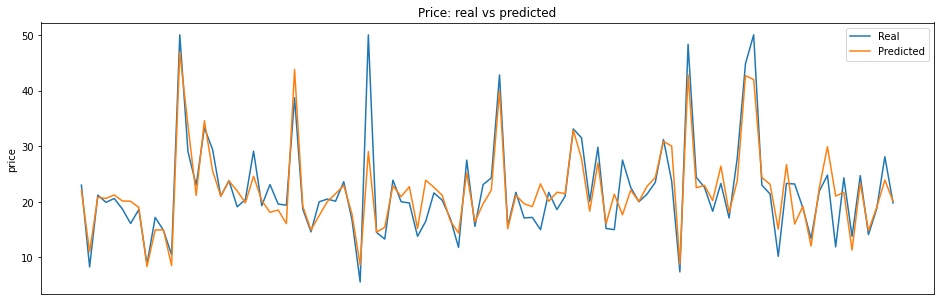

In [ ]:
plt.rcParams['figure.figsize'] = 16,5
plt.figure()
plt.plot(A[-100:], label="Real")
plt.plot(B[-100:], label="Predicted")
plt.legend()
plt.title("Price: real vs predicted")
plt.ylabel("price")
plt.xticks(())
plt.show()

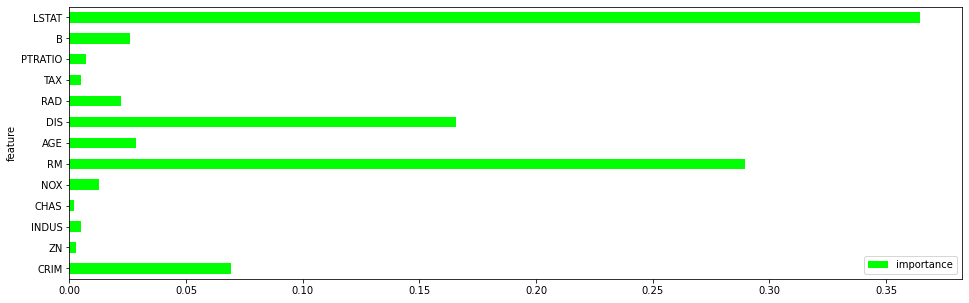

In [ ]:
features = list(X_train.columns)
feature_importances = pd.DataFrame({'feature': features, 'importance': regressor.feature_importances_})
feature_importances.plot(x = 'feature', y ='importance', kind = 'barh', color="lime")

In [ ]:
importance = regressor.feature_importances_
importance_df = pd.DataFrame(importance, index=X_train.columns, columns=["Importance"])
importance_df

,Importance
CRIM,0.069382
ZN,0.002913
INDUS,0.004817
CHAS,0.002044
NOX,0.012451
RM,0.289667
AGE,0.028409
DIS,0.165602
RAD,0.021947
TAX,0.005162


In [ ]:
user_input = {'CRIM':0.00632,'ZN':0.0,'INDUS':2.18,'CHAS':0.0,'NOX':0.538,'RM':6.421,'AGE':61.1,'DIS':6.0622,'RAD':1.0,'TAX':222.0,'PTRATIO':17.8,'B':392.83,'LSTAT':9.14}
def input_to_one_hot(a):
  enc_input=np.zeros(13)
  enc_input[0]=a['CRIM']
  enc_input[1]=a['ZN']
  enc_input[2]=a['INDUS']
  enc_input[3]=a['CHAS']
  enc_input[4]=a['NOX']
  enc_input[5]=a['RM']
  enc_input[6]=a['AGE']
  enc_input[7]=a['DIS']
  enc_input[8]=a['RAD']
  enc_input[9]=a['TAX']
  enc_input[10]=a['PTRATIO']
  enc_input[11]=a['B']
  enc_input[12]=a['LSTAT']

  return enc_input

In [ ]:
print(input_to_one_hot(user_input))

[6.3200e-03 0.0000e+00 2.1800e+00 0.0000e+00 5.3800e-01 6.4210e+00
 6.1100e+01 6.0622e+00 1.0000e+00 2.2200e+02 1.7800e+01 3.9283e+02
 9.1400e+00]


In [ ]:
b = input_to_one_hot(user_input)
b

array([6.3200e-03, 0.0000e+00, 2.1800e+00, 0.0000e+00, 5.3800e-01,
       6.4210e+00, 6.1100e+01, 6.0622e+00, 1.0000e+00, 2.2200e+02,
       1.7800e+01, 3.9283e+02, 9.1400e+00])

In [ ]:
price_pred = regressor.predict([b])
price_pred[0]

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


20.030588235294147

In [ ]:
estimator = regressor.estimators_[100]
estimator

DecisionTreeRegressor(max_depth=100, max_features='auto',
                      random_state=301492857)

In [ ]:
from IPython.display import Image
from sklearn import tree
import pydotplus
import os
os.environ["PATH"] += os.pathsep + 'C:\Program Files (x86)\Graphviz2.38/bin/'


In [ ]:
from sklearn.tree import export_graphviz
export_graphviz(estimator, out_file='tree.dot',
                feature_names = X.columns, 
                class_names = y, 
                rounded = True, proportion = False,
                precision = 3, filled = True)

In [ ]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

In [ ]:
from IPython.display import Image
Image(filename = 'tree.png')